### Initial setup

In [1]:
# --- Import libraries --- #
import pandas as pd
import numpy as np
from patsy import dmatrices, dmatrix
from scipy import stats
from scipy.special import expit as logistic
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib as mpl
import seaborn as sns

import theano
import theano.tensor as tt
import pymc3 as pm
import arviz as az

import warnings
warnings.simplefilter(action="ignore")
%config InlineBackend.figure_format = 'retina'

print("Packages uploaded successfully!")

Packages uploaded successfully!


### Data preparation

In [2]:
# --- Read data --- #
data = pd.read_csv('./machine_readable.csv')

# --- Standardise continuous values --- #
data_prep = data[['SLogP', 'Cbrain/Cblood','Syn_EC30', 
                  'Viability_EC30', 'NNF EC50min', 'NNF EC50max', 'Viability_LDH']]
sc = StandardScaler()
data_scaled = sc.fit_transform(data_prep)
data_scaled = pd.DataFrame(data_scaled)
data_scaled.columns = ['SLogP', 'Cbrain/Cblood','Syn_EC30', 
                       'Viability_EC30', 'NNF EC50min', 'NNF EC50max', 'Viability_LDH']

# Add other discrete values and details
discrete = data [['Chemical', 'CASRN', 'DNT', 'BBB', 'Pgp_inhibition', 'Pgp_substrate', 'Pgp_active', 
  'BDNF, Reduction', 'Activity_Syn', 'Activity_NNF']]
data = discrete.join(data_scaled, lsuffix="_left", rsuffix="_right")

# --- Define predictors and outcomes --- #

# BDNF given by continuous and discrete variables
x_bdnf = pd.DataFrame(data[['SLogP', 'Cbrain/Cblood', 'BBB', 
                            'Pgp_inhibition', 'Pgp_substrate', 'Pgp_active']]).values
y_bdnf = pd.DataFrame(data[['BDNF, Reduction']]).values

# SYN
x_syn = pd.DataFrame(data[['Syn_EC30', 'Viability_EC30']]).values
y_syn = pd.DataFrame(data[['Activity_Syn']]).values 

# NNF
x_nnf = pd.DataFrame(data[['NNF EC50min', 'NNF EC50max', 'Viability_LDH']]).values
y_nnf = pd.DataFrame(data[['Activity_NNF']]).values 

# x_dnt is given by causal relations BDNF->SYN->NNF->DNT<-BNDF
Y_dnt = pd.DataFrame(data[['DNT']]).values #Y because no missing values

### Masking missing values for imputation

In [3]:
# BDNF
x_bdnf_missing = np.isnan(x_bdnf)
X_bdnf_train = np.ma.masked_array(x_bdnf, mask=x_bdnf_missing)
y_bdnf_missing = np.isnan(y_bdnf)
Y_bdnf_train = np.ma.masked_array(y_bdnf, mask=y_bdnf_missing)

# SYN
x_syn_missing = np.isnan(x_syn)
X_syn_train = np.ma.masked_array(x_syn, mask=x_syn_missing)
y_syn_missing = np.isnan(y_syn)
Y_syn_train = np.ma.masked_array(y_syn, mask=y_syn_missing)

# NNF
x_nnf_missing = np.isnan(x_nnf)
X_nnf_train = np.ma.masked_array(x_nnf, mask=x_nnf_missing)
y_nnf_missing = np.isnan(y_nnf)
Y_nnf_train = np.ma.masked_array(y_nnf, mask=y_nnf_missing)

### Define and fit the model

In [4]:
with pm.Model() as model_hierar:
    # Define hyperpriors
    mu_beta = pm.Normal('mu_beta', mu=0, sd=0.01) 
    sd_beta = pm.HalfNormal('sd_beta', sd=5)
    # Define priors
    beta_bdnf = pm.Normal('beta_bdnf', mu=mu_beta, sd=sd_beta, shape=(6,1))
    beta_syn = pm.Normal('beta_syn', mu=mu_beta, sd=sd_beta, shape=(2,1))
    beta_nnf = pm.Normal('beta_nnf', mu=mu_beta, sd=sd_beta, shape=(3,1))
    
    # Imputation of X missing values for BDNF
    Xmu_bdnf = pm.Normal('Xmu_bdnf', mu=0, sd=1, shape=(1,6))
    Xsigma_bdnf = pm.HalfNormal('Xsigma_bdnf', sd=2, shape=(1,6))
    X_bdnf_modelled = pm.Normal('X_bdnf_modelled', 
                                         mu=Xmu_bdnf, sigma=Xsigma_bdnf, observed=X_bdnf_train)

    # Likelihood for BDNF
    # SLogP, Cbrain/Cblood, BBB, Pgp->BDNF
    lp_bdnf = pm.Deterministic('lp_bdnf', pm.math.dot(X_bdnf_modelled, beta_bdnf))
    y_obs_bdnf = pm.Bernoulli('y_obs_bdnf', logit_p=lp_bdnf, observed=Y_bdnf_train)
    
    # Imputation of X missing values for SYN
    Xmu_syn = pm.Normal('Xmu_syn', mu=0, sd=1, shape=(1,2))
    Xsigma_syn = pm.HalfNormal('Xsigma_syn', sd=2, shape=(1,2))
    X_syn_modelled = pm.Normal('X_syn_modelled',
                                 mu=Xmu_syn, sigma=Xsigma_syn, observed=X_syn_train)

    # Likelihood for SYN
    # BDNF->SYN
    lp_syn = pm.Deterministic('lp_syn', lp_bdnf + pm.math.dot(X_syn_modelled, beta_syn))
    y_obs_syn = pm.Bernoulli("y_obs_syn", logit_p=lp_syn, observed=Y_syn_train)
    
    # Imputation of X missing values for NNF
    Xmu_nnf = pm.Normal('Xmu_nnf', mu=0, sd=1, shape=(1,3))
    Xsigma_nnf = pm.HalfNormal('Xsigma_nnf', sd=2, shape=(1,3)) 
    X_nnf_modelled = pm.Normal('X_nnf_modelled',
                                 mu=Xmu_nnf, sd=Xsigma_nnf, observed=X_nnf_train)
   
    # Likelihood for NNF
    # BDNF->SYN->NNF
    lp_nnf = pm.Deterministic('lp_nnf', lp_syn + pm.math.dot(X_nnf_modelled, beta_nnf))
    y_obs_nnf = pm.Bernoulli("y_obs_nnf", logit_p=lp_nnf, observed=Y_nnf_train)
    
    # Define causal relationships for DNT
    lp_dnt = pm.Deterministic('lp_dnt', lp_bdnf + lp_syn + lp_nnf)
    y_obs_dnt = pm.Bernoulli('y_obs_dnt', logit_p=lp_dnt, observed=Y_dnt)

# Checking the proposed structure of model
model_hierar.check_test_point()

mu_beta                      3.69
sd_beta_log__               -0.77
beta_bdnf                  -13.82
beta_syn                    -4.61
beta_nnf                    -6.91
Xmu_bdnf                    -5.51
Xsigma_bdnf_log__           -4.62
X_bdnf_modelled_missing      0.00
y_obs_bdnf_missing           0.00
Xmu_syn                     -1.84
Xsigma_syn_log__            -1.54
X_syn_modelled_missing       0.00
y_obs_syn_missing            0.00
Xmu_nnf                     -2.76
Xsigma_nnf_log__            -2.31
X_nnf_modelled_missing       0.00
y_obs_nnf_missing            0.00
X_bdnf_modelled           -860.43
y_obs_bdnf                 -67.24
X_syn_modelled            -295.25
y_obs_syn                  -67.24
X_nnf_modelled            -452.89
y_obs_nnf                  -67.24
y_obs_dnt                  -67.24
Name: Log-probability of test_point, dtype: float64

In [5]:
# --- Run inferences and compute posterior distributions --- #
with model_hierar:
    trace_hierar = pm.sample(cores=4, draws=10000, nuts ={'target_accept':0.90})
    #Predictions
    posterior_hierar = pm.sample_posterior_predictive(trace_hierar)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [X_nnf_modelled_missing, Xsigma_nnf, Xmu_nnf, X_syn_modelled_missing, Xsigma_syn, Xmu_syn, X_bdnf_modelled_missing, Xsigma_bdnf, Xmu_bdnf, beta_nnf, beta_syn, beta_bdnf, sd_beta, mu_beta]
>BinaryGibbsMetropolis: [y_obs_bdnf_missing, y_obs_syn_missing, y_obs_nnf_missing]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 335 seconds.


In [6]:
# --- Convert and store in Arviz format --- #
idata_hierar = az.from_pymc3(trace=trace_hierar, 
                             posterior_predictive=posterior_hierar,
                             model=model_hierar)
idata_hierar

Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> observed_data

In [9]:
ylabels= data["Chemical"].astype(str) + " (" + data["CASRN"].astype(str) + ")"

## FOR BDNF -> first key event predictions

### Posterior distribution

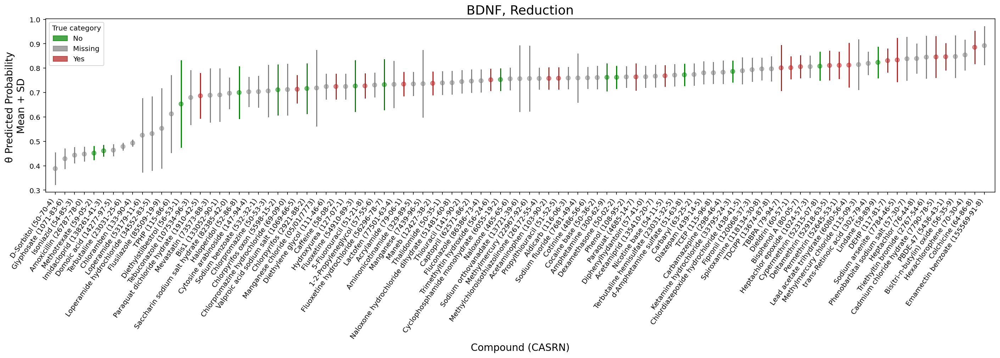

In [10]:
# Scatter plot meadn + std for theta posterior

obs_bdnf = np.squeeze(logistic(idata_hierar.posterior['lp_bdnf']))
obs_pred = np.reshape(obs_bdnf.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
std_obs_pred = obs_pred.std(axis=0)
order = np.argsort(avg_obs_pred)

y_bdnf_labeling = y_bdnf.copy()
y_bdnf_labeling[np.isnan(y_bdnf)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_bdnf_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(24, 5))
ax.scatter(range(len(avg_obs_pred)), avg_obs_pred[order], c=color_label[order], alpha = 0.5)
for i, m, se, color in zip(
    range(len(avg_obs_pred)),
    avg_obs_pred[order],
    std_obs_pred[order],
    color_label[order]):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(np.arange(97))
ax.set_xticklabels(ylabels[order]);
ax.set_ylabel('\u03B8 Predicted Probability \nMean + SD', fontsize=14)
ax.set_xlabel('Compound (CASRN)', fontsize=14)
ax.set_title("BDNF, Reduction", fontsize=18)

ax.set_xlim([-1, 97.1])

green_patch = mpatches.Patch(color='green', label='No', alpha=0.7)
gray_patch = mpatches.Patch(color='gray', label='Missing', alpha=0.7)
red_patch = mpatches.Patch(color='firebrick', label='Yes', alpha=0.7)
plt.legend(handles=[green_patch, gray_patch, red_patch], loc='upper left', title="True category")

fig.autofmt_xdate(rotation=55);

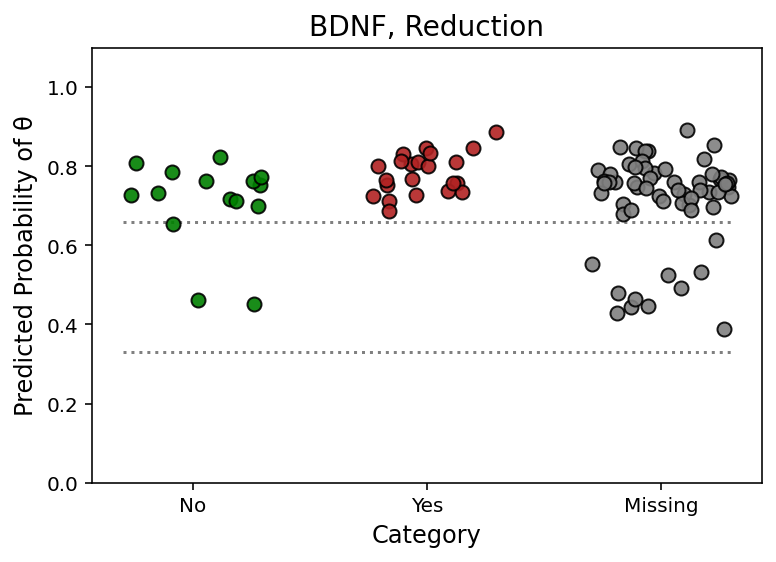

In [11]:
# BDNF
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("BDNF, Reduction", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.33, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
plt.hlines(0.66, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted Probability of \u03B8", fontsize=12);

### Posterior predictive distribution

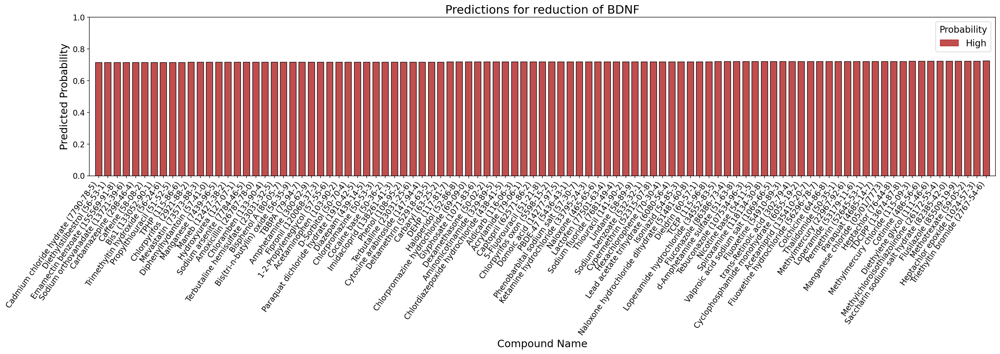

In [12]:
# Colour-coded based on the low, medium and high risk

obs_bdnf = np.squeeze(idata_hierar.posterior_predictive['y_obs_bdnf'])
obs_pred = np.reshape(obs_bdnf.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
order = np.argsort(avg_obs_pred)

new_labeling = np.zeros(avg_obs_pred.shape, dtype=int)
new_labeling[avg_obs_pred < .34] = 0
new_labeling[(avg_obs_pred >= .34) & (avg_obs_pred < .67)] = 1
new_labeling[avg_obs_pred >= .67] = 2

cc = np.asarray(['green', 'goldenrod', 'firebrick'])
class_label = np.squeeze(new_labeling.astype(int))
color_label = cc[class_label]


fig, ax = plt.subplots(figsize=(25, 5))
ax.bar(np.arange(97), avg_obs_pred[order], color=color_label[order], alpha = 0.8, edgecolor='black', width=0.7)

ax.set_xticks(np.arange(97))
ax.set_xticklabels(ylabels[order], fontsize=12)
ax.tick_params(axis="y", labelsize=12)
ax.set_ylabel('Predicted Probability', fontsize=16)
ax.set_xlabel('Compound Name', fontsize=16)
ax.set_title("Predictions for reduction of BDNF", fontsize=18)

ax.set_xlim([-1, 97])
ax.set_ylim([0, 1])

#green_patch = mpatches.Patch(color='green', label='Low', alpha=0.7)
#yellow_patch = mpatches.Patch(color='goldenrod', label='Medium', alpha=0.7)
red_patch = mpatches.Patch(color='firebrick', label='High', alpha=0.8)
plt.legend(handles=[red_patch], title="Probability", title_fontsize=14, fontsize=14)

fig.autofmt_xdate(rotation=55);

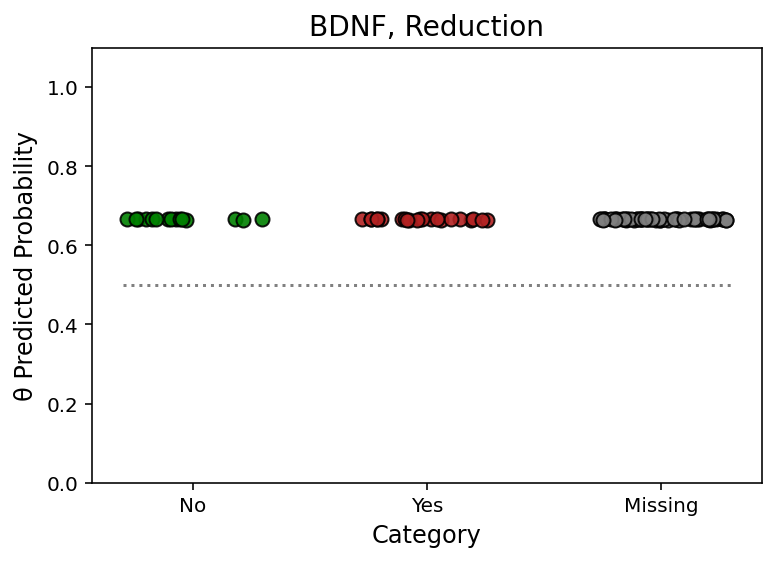

In [13]:
# BDNF
obs_bdnf = np.squeeze(logistic(idata_hierar.posterior_predictive['y_obs_bdnf']))
obs_pred = np.reshape(obs_bdnf.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)

y_bdnf_labeling = y_bdnf.copy()
y_bdnf_labeling[np.isnan(y_bdnf)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_bdnf_labeling.astype(int))
color_label = cc[class_label]
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("BDNF, Reduction", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
plt.ylabel("\u03B8 Predicted Probability", fontsize=12);

## FOR SYN -> second key event predictions

### Posterior distribution

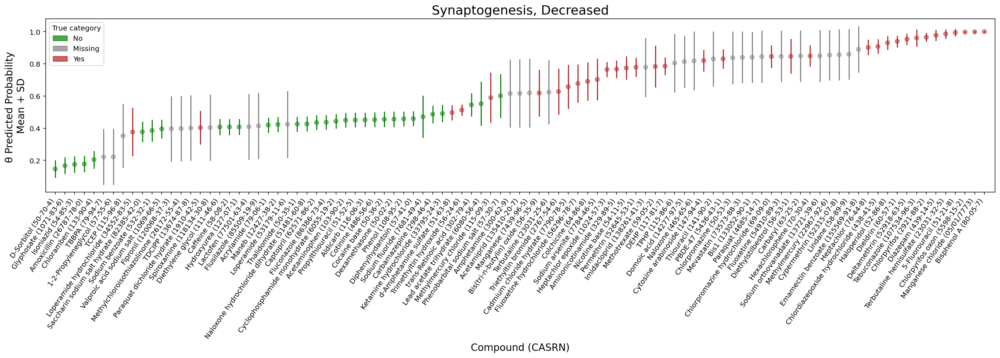

In [14]:
# Scatter plot meadn + std for theta posterior

obs_syn = np.squeeze(logistic(idata_hierar.posterior['lp_syn']))
obs_pred = np.reshape(obs_syn.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
std_obs_pred = obs_pred.std(axis=0)
order = np.argsort(avg_obs_pred)

y_syn_labeling = y_syn.copy()
y_syn_labeling[np.isnan(y_syn)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_syn_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(24, 5))
ax.scatter(range(len(avg_obs_pred)), avg_obs_pred[order], c=color_label[order], alpha = 0.5)
for i, m, se, color in zip(
    range(len(avg_obs_pred)),
    avg_obs_pred[order],
    std_obs_pred[order],
    color_label[order]):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(np.arange(97))
ax.set_xticklabels(ylabels[order]);
ax.set_ylabel('\u03B8 Predicted Probability \nMean + SD', fontsize=14)
ax.set_xlabel('Compound (CASRN)', fontsize=14)
ax.set_title("Synaptogenesis, Decreased", fontsize=18)

ax.set_xlim([-1, 97.1])

green_patch = mpatches.Patch(color='green', label='No', alpha=0.7)
gray_patch = mpatches.Patch(color='gray', label='Missing', alpha=0.7)
red_patch = mpatches.Patch(color='firebrick', label='Yes', alpha=0.7)
plt.legend(handles=[green_patch, gray_patch, red_patch], loc='upper left', title="True category")

fig.autofmt_xdate(rotation=55);

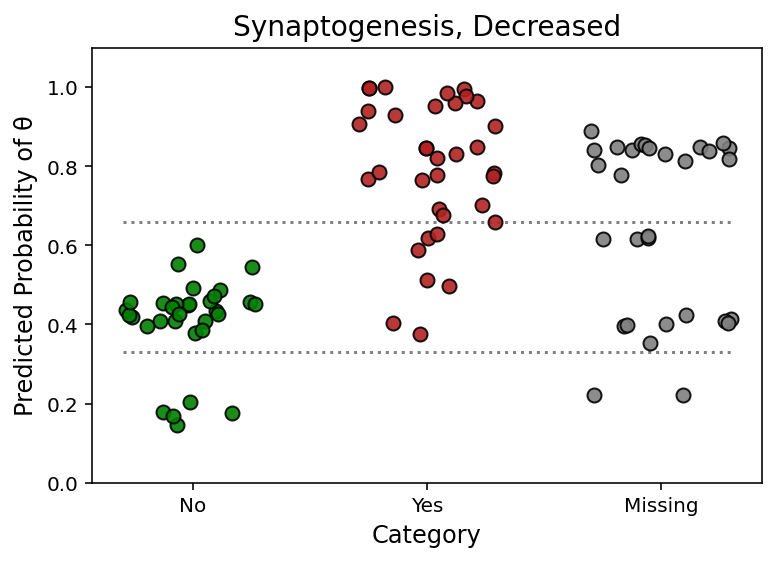

In [15]:
# SYN
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Synaptogenesis, Decreased", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.33, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
plt.hlines(0.66, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted Probability of \u03B8", fontsize=12);


### Posterior predictive distribution

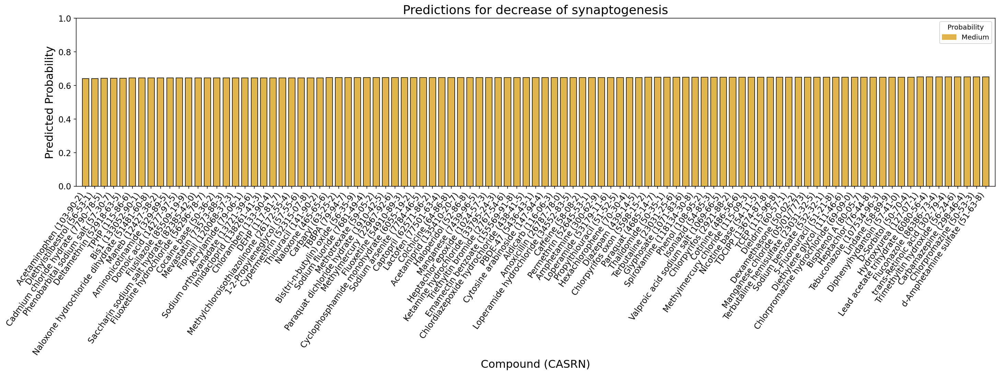

In [16]:
# Colour-coded based on the low, medium and high risk

obs_syn = np.squeeze(idata_hierar.posterior_predictive['y_obs_syn'])
obs_pred = np.reshape(obs_syn.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
order = np.argsort(avg_obs_pred)

new_labeling = np.zeros(avg_obs_pred.shape, dtype=int)
new_labeling[avg_obs_pred < .33] = 0
new_labeling[(avg_obs_pred >= .33) & (avg_obs_pred < .66)] = 1
new_labeling[avg_obs_pred >= .66] = 2

cc = np.asarray(['green', 'goldenrod', 'firebrick'])
class_label = np.squeeze(new_labeling.astype(int))
color_label = cc[class_label]


fig, ax = plt.subplots(figsize=(24, 5))
ax.bar(np.arange(97), avg_obs_pred[order], color=color_label[order], alpha = 0.8, edgecolor='black', width=0.7)

ax.set_xticks(np.arange(97))
ax.set_xticklabels(ylabels[order], fontsize=12)
ax.tick_params(axis="y", labelsize=12)
ax.set_ylabel('Predicted Probability', fontsize=16)
ax.set_xlabel('Compound (CASRN)', fontsize=16)
ax.set_title("Predictions for decrease of synaptogenesis", fontsize=18)

ax.set_xlim([-1, 97])
ax.set_ylim([0, 1])

#green_patch = mpatches.Patch(color='green', label='Low', alpha=0.7)
yellow_patch = mpatches.Patch(color='goldenrod', label='Medium', alpha=0.8)
#red_patch = mpatches.Patch(color='firebrick', label='High', alpha=0.8)
plt.legend(handles=[yellow_patch], title="Probability")

fig.autofmt_xdate(rotation=55);

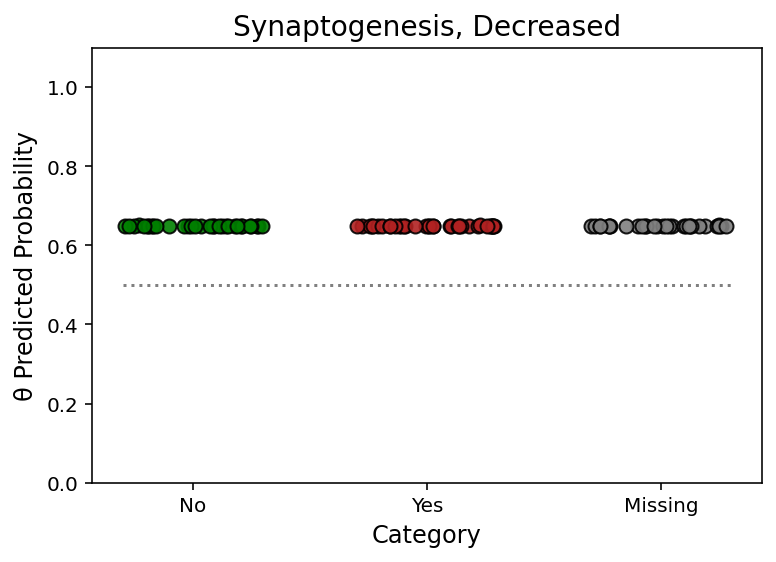

In [17]:
# SYN
obs_syn = np.squeeze(logistic(idata_hierar.posterior_predictive['y_obs_syn']))
obs_pred = np.reshape(obs_syn.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)

y_syn_labeling = y_syn.copy()
y_syn_labeling[np.isnan(y_syn)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_syn_labeling.astype(int))
color_label = cc[class_label]
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Synaptogenesis, Decreased", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("\u03B8 Predicted Probability", fontsize=12);

## FOR NNF -> third key event predictions

### Posterior distribution

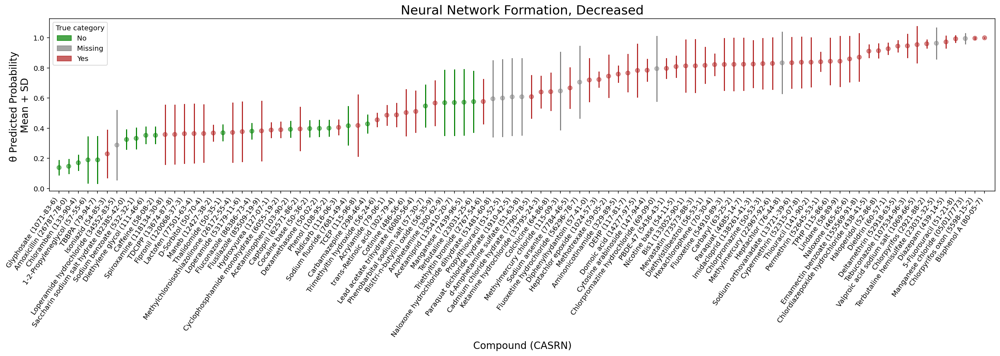

In [18]:
# Scatter plot meadn + std for theta posterior

obs_nnf = np.squeeze(logistic(idata_hierar.posterior['lp_nnf']))
obs_pred = np.reshape(obs_nnf.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
std_obs_pred = obs_pred.std(axis=0)
order = np.argsort(avg_obs_pred)

y_syn_labeling = y_nnf.copy()
y_syn_labeling[np.isnan(y_nnf)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_syn_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(24, 5))
ax.scatter(range(len(avg_obs_pred)), avg_obs_pred[order], c=color_label[order], alpha = 0.5)
for i, m, se, color in zip(
    range(len(avg_obs_pred)),
    avg_obs_pred[order],
    std_obs_pred[order],
    color_label[order]):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(np.arange(97))
ax.set_xticklabels(ylabels[order]);
ax.set_ylabel('\u03B8 Predicted Probability \nMean + SD', fontsize=14)
ax.set_xlabel('Compound (CASRN)', fontsize=14)
ax.set_title("Neural Network Formation, Decreased", fontsize=18)

ax.set_xlim([-1, 97.1])

green_patch = mpatches.Patch(color='green', label='No', alpha=0.7)
gray_patch = mpatches.Patch(color='gray', label='Missing', alpha=0.7)
red_patch = mpatches.Patch(color='firebrick', label='Yes', alpha=0.7)
plt.legend(handles=[green_patch, gray_patch, red_patch], loc='upper left', title="True category")

fig.autofmt_xdate(rotation=55);

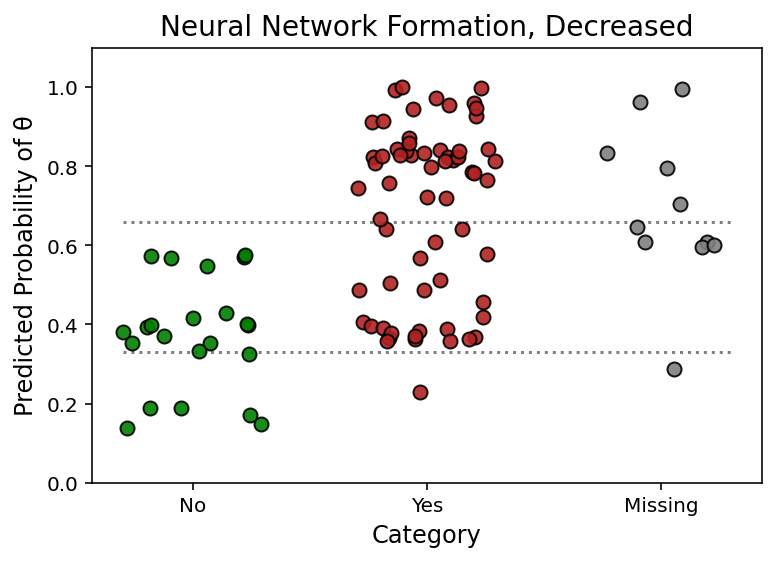

In [19]:
# NNF
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Neural Network Formation, Decreased", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.33, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
plt.hlines(0.66, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted Probability of \u03B8", fontsize=12);

### Posterior predictive distribution

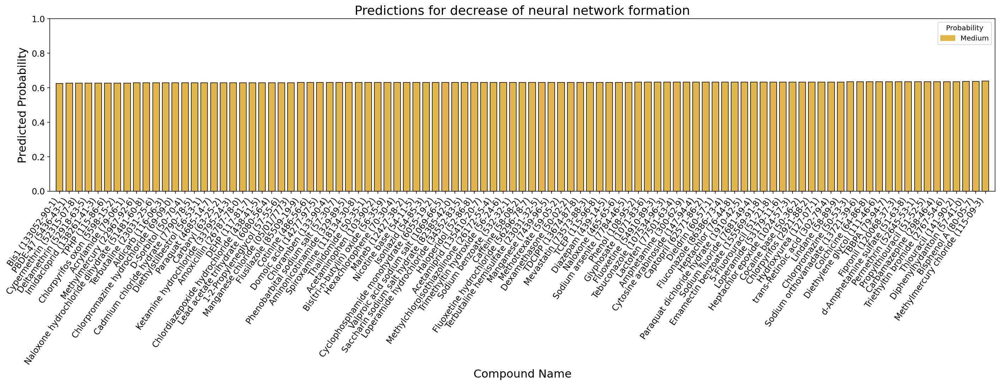

In [20]:
# Colour-coded based on the low, medium and high risk

obs_nnf = np.squeeze(idata_hierar.posterior_predictive['y_obs_nnf'])
obs_pred = np.reshape(obs_nnf.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
order = np.argsort(avg_obs_pred)

new_labeling = np.zeros(avg_obs_pred.shape, dtype=int)
new_labeling[avg_obs_pred < .33] = 0
new_labeling[(avg_obs_pred >= .33) & (avg_obs_pred < .66)] = 1
new_labeling[avg_obs_pred >= .66] = 2

cc = np.asarray(['green', 'goldenrod', 'firebrick'])
class_label = np.squeeze(new_labeling.astype(int))
color_label = cc[class_label]


fig, ax = plt.subplots(figsize=(24, 5))
ax.bar(np.arange(97), avg_obs_pred[order], color=color_label[order], alpha = 0.8, edgecolor='black', width=0.7)

ax.set_xticks(np.arange(97))
ax.set_xticklabels(ylabels[order], fontsize=12)
ax.tick_params(axis="y", labelsize=12)
ax.set_ylabel('Predicted Probability', fontsize=16)
ax.set_xlabel('Compound Name', fontsize=16)
ax.set_title("Predictions for decrease of neural network formation", fontsize=18)

ax.set_xlim([-1, 97])
ax.set_ylim([0, 1])

#green_patch = mpatches.Patch(color='green', label='Low', alpha=0.7)
yellow_patch = mpatches.Patch(color='goldenrod', label='Medium', alpha=0.8)
#red_patch = mpatches.Patch(color='firebrick', label='High', alpha=0.7)
plt.legend(handles=[yellow_patch], title="Probability")

fig.autofmt_xdate(rotation=55);

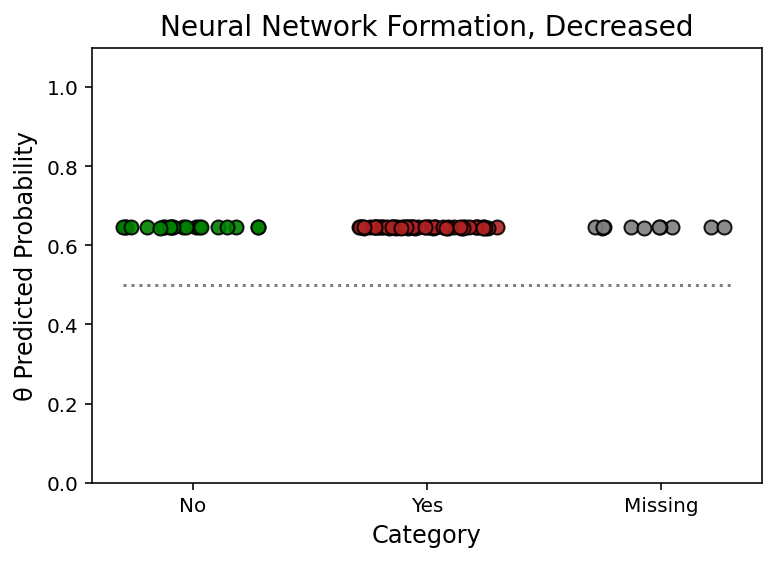

In [21]:
# NNF
obs_syn = np.squeeze(logistic(idata_hierar.posterior_predictive['y_obs_nnf']))
obs_pred = np.reshape(obs_syn.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)

y_nnf_labeling = y_nnf.copy()
y_nnf_labeling[np.isnan(y_nnf)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_nnf_labeling.astype(int))
color_label = cc[class_label]
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Neural Network Formation, Decreased", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("\u03B8 Predicted Probability", fontsize=12);

## FOR DNT -> fourth/final key event predictions

### Posterior distribution

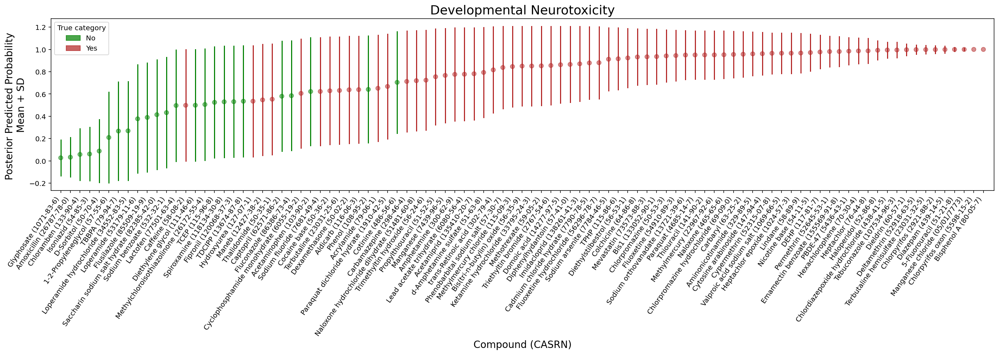

In [22]:
# Scatter plot meadn + std for posterior predictions

obs_dnt = np.squeeze(idata_hierar.posterior_predictive['y_obs_dnt'])
obs_pred = np.reshape(obs_dnt.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
std_obs_pred = obs_pred.std(axis=0)
order = np.argsort(avg_obs_pred)

y_dnt_labeling = Y_dnt.copy()
y_dnt_labeling[np.isnan(Y_dnt)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_dnt_labeling.astype(int))
color_label = cc[class_label]

fig, ax = plt.subplots(figsize=(24, 5))
ax.scatter(range(len(avg_obs_pred)), avg_obs_pred[order], c=color_label[order], alpha = 0.5)
for i, m, se, color in zip(
    range(len(avg_obs_pred)),
    avg_obs_pred[order],
    std_obs_pred[order],
    color_label[order]):
    ax.plot([i,i], [m-se, m+se], color=color)
    
#ax.tick_params(axis='x', which='major', pad=30)
ax.set_xticks(np.arange(97))
ax.set_xticklabels(ylabels[order]);
ax.set_ylabel('Posterior Predicted Probability \nMean + SD', fontsize=14)
ax.set_xlabel('Compound (CASRN)', fontsize=14)
ax.set_title("Developmental Neurotoxicity", fontsize=18)

ax.set_xlim([-1, 97.1])

green_patch = mpatches.Patch(color='green', label='No', alpha=0.7)
#yellow_patch = mpatches.Patch(color='goldenrod', label='Medium')
red_patch = mpatches.Patch(color='firebrick', label='Yes', alpha=0.7)
plt.legend(handles=[green_patch, red_patch], loc='upper left', title="True category")

fig.autofmt_xdate(rotation=55);

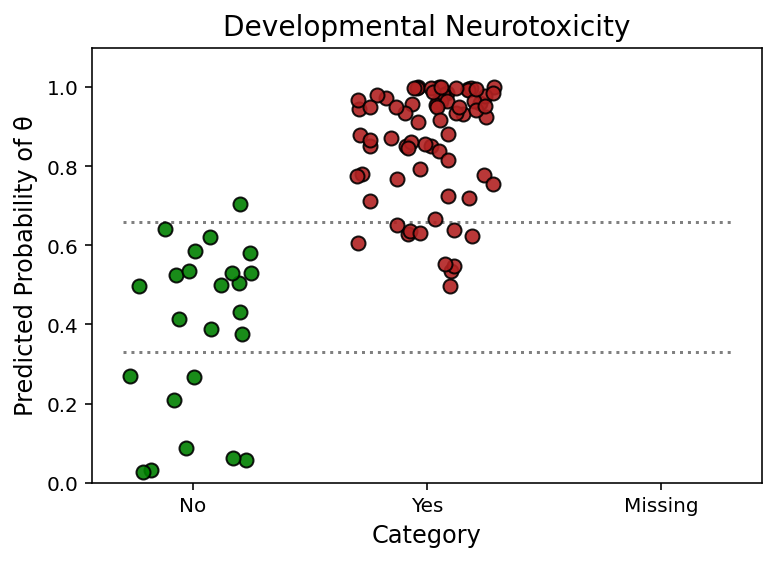

In [23]:
# DNT
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Developmental Neurotoxicity", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.33, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
plt.hlines(0.66, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted Probability of \u03B8", fontsize=12);

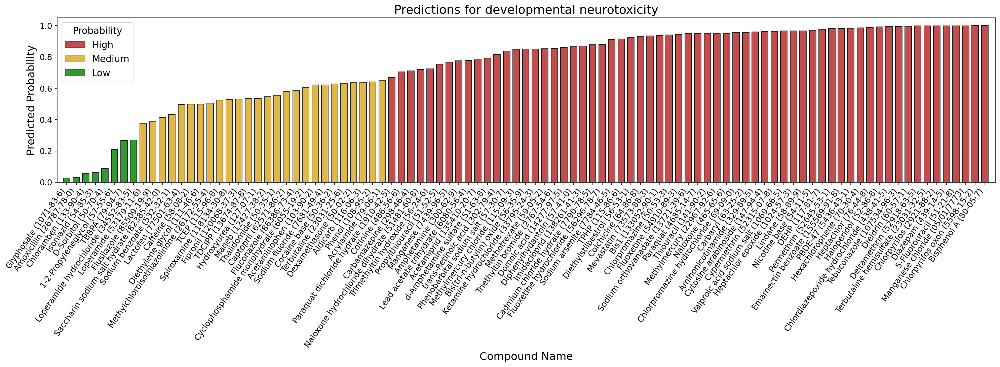

In [24]:
# Colour-coded based on the low, medium and high risk

obs_dnt = np.squeeze(idata_hierar.posterior_predictive['y_obs_dnt'])
obs_pred = np.reshape(obs_dnt.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
order = np.argsort(avg_obs_pred)

new_labeling = np.zeros(avg_obs_pred.shape, dtype=int)
new_labeling[avg_obs_pred < .33] = 0
new_labeling[(avg_obs_pred >= .33) & (avg_obs_pred < .66)] = 1
new_labeling[avg_obs_pred >= .66] = 2

cc = np.asarray(['green', 'goldenrod', 'firebrick'])
class_label = np.squeeze(new_labeling.astype(int))
color_label = cc[class_label]


fig, ax = plt.subplots(figsize=(25, 5))
ax.bar(np.arange(97), avg_obs_pred[order], color=color_label[order], alpha = 0.8, edgecolor='black', width=0.7)

ax.set_xticks(np.arange(97))
ax.set_xticklabels(ylabels[order], fontsize=12)
ax.tick_params(axis="y", labelsize=12)

ax.set_ylabel('Predicted Probability', fontsize=16)
ax.set_xlabel('Compound Name', fontsize=16)
ax.set_title("Predictions for developmental neurotoxicity", 
             fontsize=18)

ax.set_xlim([-1, 97.1])

#ax.spines['right'].set_visible(False)
#ax.spines['top'].set_visible(False)

green_patch = mpatches.Patch(color='green', label='Low', alpha=0.8)
yellow_patch = mpatches.Patch(color='goldenrod', label='Medium', alpha=0.8)
red_patch = mpatches.Patch(color='firebrick', label='High', alpha=0.8)
plt.legend(handles=[red_patch, yellow_patch, green_patch], title = 'Probability', title_fontsize=14, fontsize=14)

fig.autofmt_xdate(rotation=55);

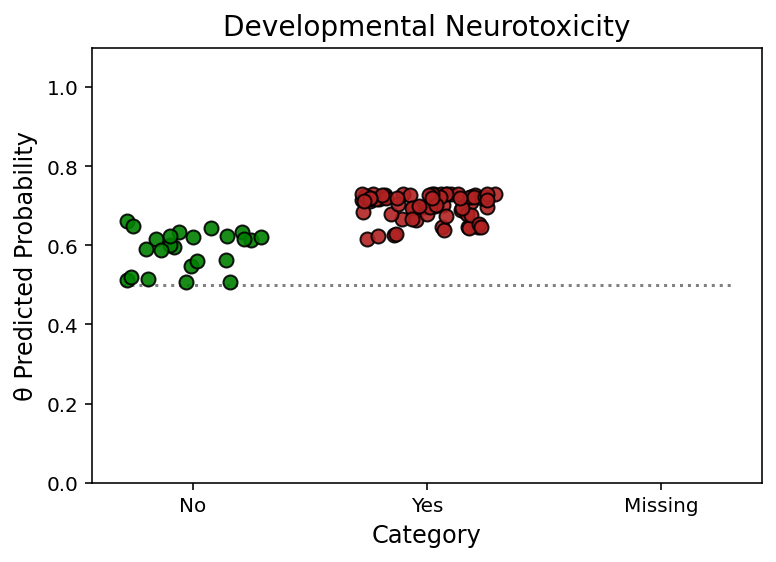

In [27]:
# NNF
obs_dnt = np.squeeze(logistic(idata_hierar.posterior_predictive['y_obs_dnt']))
obs_pred = np.reshape(obs_dnt.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)

y_dnt_labeling = Y_dnt.copy()
y_dnt_labeling[np.isnan(Y_dnt)] = 2.
cc = np.asarray(['green', 'firebrick', 'gray'])
class_label = np.squeeze(y_dnt_labeling.astype(int))
color_label = cc[class_label]
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Developmental Neurotoxicity", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("\u03B8 Predicted Probability", fontsize=12);

In [69]:
from sklearn.metrics import confusion_matrix
obs_dnt = np.squeeze(idata_hierar.posterior_predictive['y_obs_dnt'])
obs_pred = np.reshape(obs_dnt.values, (40000, 97))
y_pred = obs_pred.mean(axis=0)
y_pred_round = y_pred.round()  # y_mean.round()
y_true = Y_dnt.copy()
cm1 = confusion_matrix(y_true, y_pred_round)
print('Confusion Matrix : \n', cm1)

Confusion Matrix : 
 [[14 10]
 [ 0 73]]


In [70]:

total1=sum(sum(cm1))
#####from confusion matrix calculate accuracy
accuracy1=(cm1[0,0]+cm1[1,1])/total1
print ('Accuracy : ', accuracy1)

sensitivity1 = cm1[0,0]/(cm1[0,0]+cm1[0,1])
print('Sensitivity : ', sensitivity1 )

specificity1 = cm1[0,0]/(cm1[0,0]+cm1[1,0])
print('Specificity : ', specificity1)

Accuracy :  0.8969072164948454
Sensitivity :  0.5833333333333334
Specificity :  1.0


In [71]:
#Accuracy of the model
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import accuracy_score

obs_dnt = np.squeeze(idata_hierar.posterior_predictive['y_obs_dnt'])
obs_pred = np.reshape(obs_dnt.values, (40000, 97))
y_pred = obs_pred.mean(axis=0)
y_pred_b = y_pred.round()  # y_mean.round()
y_true = Y_dnt.copy()

accuracy_score = accuracy_score(y_true, y_pred.round(), normalize=False)
balanced_accuracy_score = balanced_accuracy_score(y_true, y_pred.round())
print(accuracy_score, balanced_accuracy_score)

87 0.7916666666666667


In [50]:
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import accuracy_score
obs_dnt = np.squeeze(logistic(idata_hierar.posterior['lp_dnt']))
obs_pred = np.reshape(obs_dnt.values, (40000, 97))
y_pred_dnt = obs_pred.mean(axis=0)
y_pred_dnt = y_pred_dnt.round()  # y_mean.round()

y_true_dnt = Y_dnt.copy()

accuracy_score = accuracy_score(y_true_dnt, y_pred_dnt)
balanced_accuracy_score = balanced_accuracy_score(y_true_dnt, y_pred_dnt)
print(accuracy_score, balanced_accuracy_score)

0.8865979381443299 0.7848173515981736


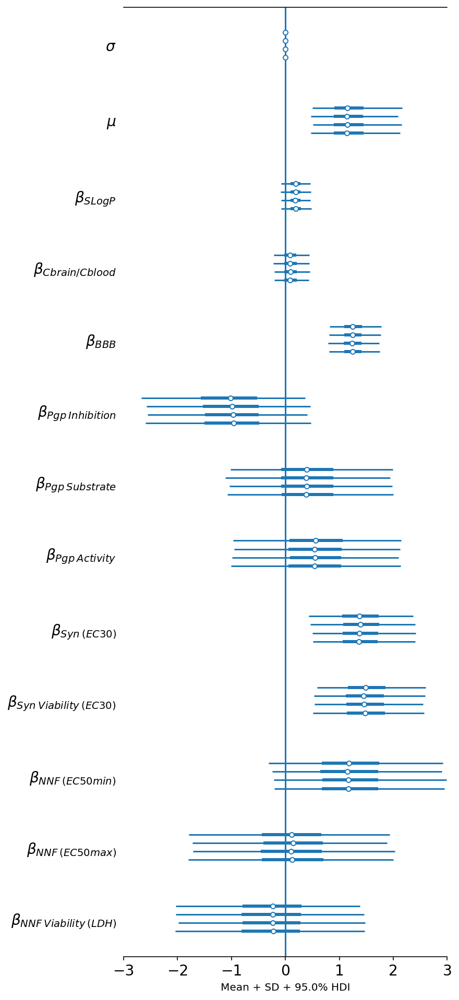

In [7]:
# For manuscript
# Plot parameters for model_hierar
ax = pm.forestplot(trace_hierar, var_names=['mu_beta', 'sd_beta','beta_bdnf', 'beta_syn', 'beta_nnf'],
                  hdi_prob=0.95);
ax[0].vlines(0., *ax[0].get_ylim());
ax[0].set_xlim([-3,3]);
ax[0].set_yticklabels((r'$\beta_{NNF\:Viability\:(LDH)}$', 
                       r'$\beta_{NNF\:(EC50max)}$', r'$\beta_{NNF\:(EC50min)}$', r'$\beta_{Syn\:Viability\:(EC30)}$', 
                       r'$\beta_{Syn\:(EC30)}$', r'$\beta_{Pgp\: Activity}$', r'$\beta_{Pgp\: Substrate}$', 
                       r'$\beta_{Pgp\: Inhibition}$', r'$\beta_{BBB}$', r'$\beta_{Cbrain/Cblood}$', 
                       r'$\beta_{SLogP}$', r'$\mu$', r'$\sigma$'))
#ax[0].set_title('94.0% Highest Density Interval of Regression Model based on Distribution Imputation');
ax[0].set_xlabel('Mean + SD + 95.0% HDI');
ax[0].set_title("");
#Four lines per each beta because we run four chains

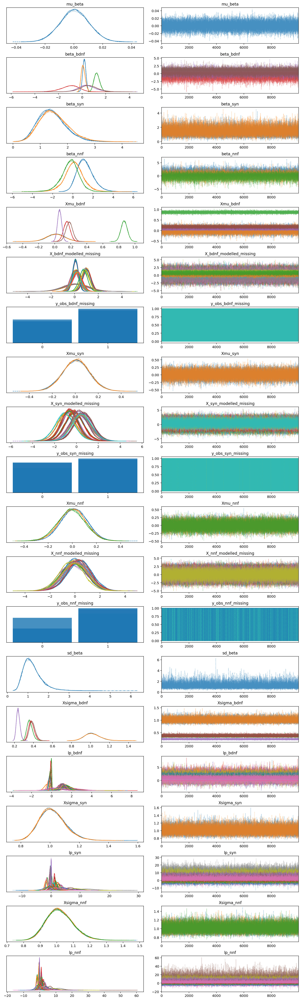

In [7]:
# --- Plot traces of all variables --- #
pm.traceplot(trace_hierar);

In [8]:
# --- Statistical summary --- #
stats = pm.summary(trace_hierar, round_to=None);
stats

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
mu_beta,0.000,0.010,-0.019,0.019,0.000,0.000,84818.0,14078.0,84874.0,28854.0,1.0
"beta_bdnf[0,0]",0.191,0.140,-0.070,0.455,0.001,0.001,35828.0,33199.0,35850.0,33045.0,1.0
"beta_bdnf[1,0]",0.101,0.172,-0.213,0.425,0.001,0.001,31912.0,28645.0,32492.0,31463.0,1.0
"beta_bdnf[2,0]",1.258,0.243,0.827,1.730,0.002,0.001,15211.0,15061.0,15411.0,22432.0,1.0
"beta_bdnf[3,0]",-1.044,0.768,-2.558,0.304,0.006,0.004,14735.0,14735.0,14980.0,21110.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
"lp_dnt[92,0]",0.223,2.022,-3.679,4.079,0.011,0.009,31931.0,25039.0,31857.0,31340.0,1.0
"lp_dnt[93,0]",0.924,2.067,-2.950,4.904,0.011,0.009,32716.0,24906.0,32789.0,29794.0,1.0
"lp_dnt[94,0]",12.406,4.449,4.400,20.819,0.034,0.024,17157.0,17157.0,17446.0,24268.0,1.0
"lp_dnt[95,0]",5.725,3.567,-0.284,12.563,0.020,0.014,32060.0,30411.0,31489.0,28750.0,1.0


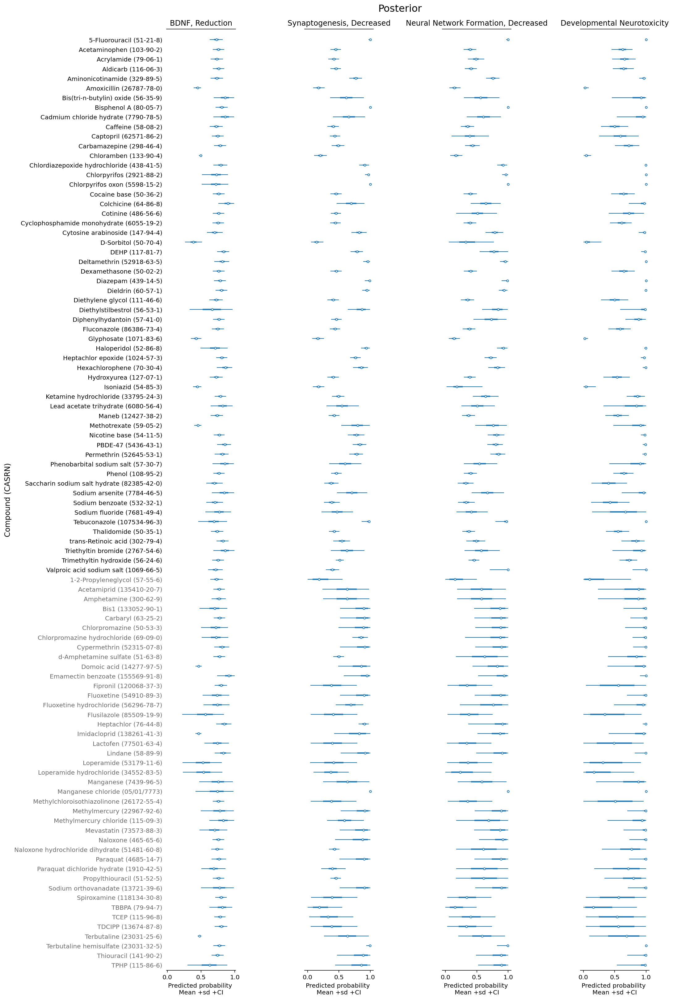

In [9]:
# --- Plot the results --- #

ylabels= data["Chemical"].astype(str) + " (" + data["CASRN"].astype(str) + ")"

fig, ax = plt.subplots(1, 4, figsize=(14,28), sharey=True)


ax0 = pm.forestplot(idata_hierar.posterior, 
                   var_names='lp_bdnf', combined=True, transform=logistic,
                   textsize=10, ax = ax[0], hdi_prob=0.95)
ax1 = pm.forestplot(idata_hierar.posterior, 
                   var_names='lp_syn', combined=True, transform=logistic,
                   textsize=10, ax = ax[1], hdi_prob=0.95)

ax2 = pm.forestplot(idata_hierar.posterior, 
                   var_names='lp_nnf', combined=True, transform=logistic,
                   textsize=10, ax = ax[2], hdi_prob=0.95)
ax3 = pm.forestplot(idata_hierar.posterior, 
                   var_names='lp_dnt', combined=True, transform=logistic,
                   textsize=10, ax = ax[3], hdi_prob=0.95)

ax[0].set_yticklabels(ylabels[::-1]) #weight = 'bold'

for ind in range(0,41):
    ax[0].get_yticklabels()[ind].set_color("dimgray") #Compounds non-tested in both in vitro studies

ax[0].set_xlim([-0.01,1.01])

for ax_ in ax:
    ax_.set_xlabel("Predicted probability \nMean +sd +CI")

ax[0].set_ylabel("Compound (CASRN)", fontsize=12)
ax[0].set_title("BDNF, Reduction", fontsize=12)
ax[1].set_title("Synaptogenesis, Decreased", fontsize=12)
ax[2].set_title("Neural Network Formation, Decreased", fontsize=12)
ax[3].set_title("Developmental Neurotoxicity", fontsize=12);

plt.subplots_adjust(wspace=1)
plt.suptitle("Posterior", y=0.9, fontsize=16); 
#fig.savefig("./Posterior.pdf", bbox_inches='tight')
#plt.tight_layout();

In [7]:
ylabels = data["Chemical"].astype(str)
ylabels_common = ylabels[0:56]
ylabels_noncommon = ylabels[56:97]

In [8]:
def get_forestplot_line(ax, kind):
    widths = {'median': 2.8, 'iqr': 2.0, 'hpd': 1.0}
    assert kind in widths.keys(), f'line kind must be one of {widths.keys()}'
    lines = []
    for child in ax.get_children():
        if isinstance(child, mpl.lines.Line2D) and np.allclose(child.get_lw(), widths[kind]):
            lines.append(child)
    return lines

In [9]:
def adjust_forestplot_for_slides(ax):    
    for line in get_forestplot_line(ax, kind='median'):
        line.set_markersize(10)

    for line in get_forestplot_line(ax, kind='iqr'):
        line.set_linewidth(5)

    for line in get_forestplot_line(ax, kind='hpd'):
        line.set_linewidth(3)
        
    return ax

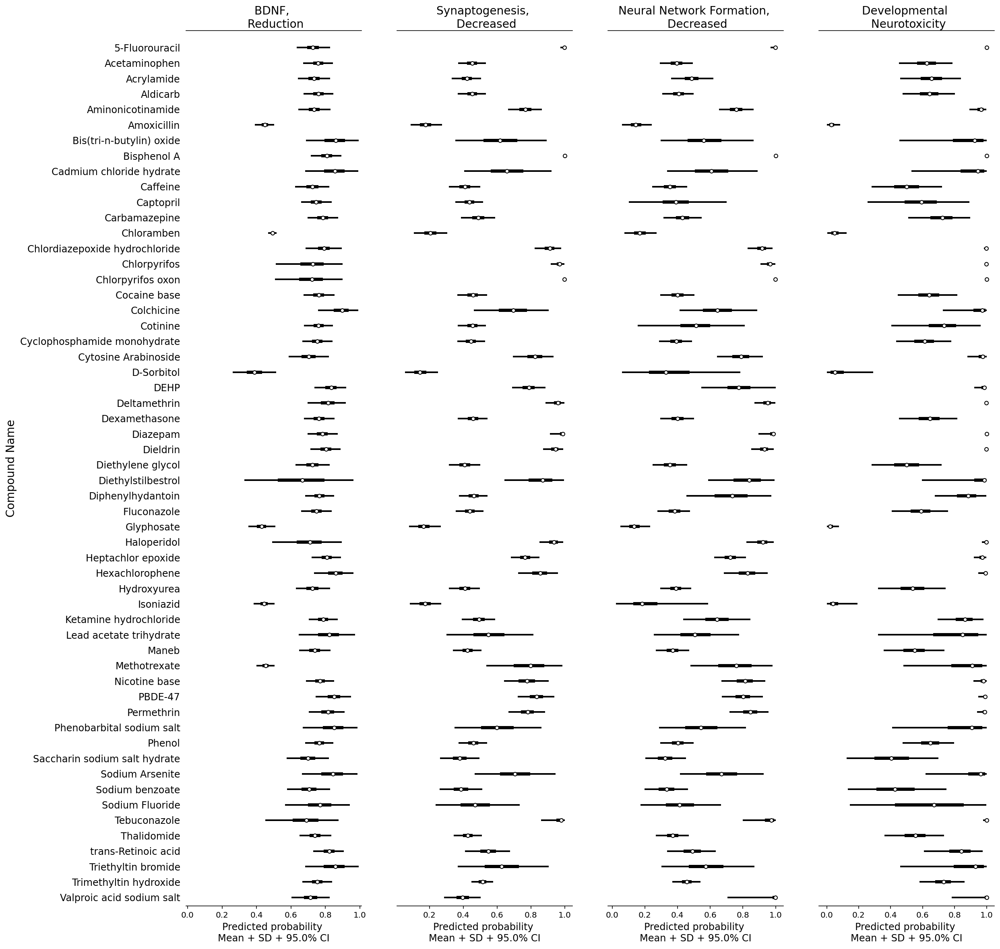

In [72]:
# ## Forestplots with underlying the compounds tested in both studies
fig, ax = plt.subplots(1, 4, figsize=(18,20), sharey=True)


ax0 = az.plot_forest(trace_hierar, var_names='lp_bdnf', kind='forestplot', colors='k', linewidth=2, markersize=6,
                    coords={'lp_bdnf_dim_0':[0,1,2,3,4,5,6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 
                                            38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[0])
ax0 = plt.gca()
ax0 = adjust_forestplot_for_slides(ax0)

ax1 = az.plot_forest(trace_hierar, var_names='lp_syn', kind='forestplot', colors='k', linewidth=2, markersize=6,
                    coords={'lp_syn_dim_0':[0,1,2,3,4,5,6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 
                                            38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[1])
ax1 = plt.gca()
ax1 = adjust_forestplot_for_slides(ax1)

ax2 = az.plot_forest(trace_hierar, var_names='lp_nnf', kind='forestplot', colors='k', linewidth=2, markersize=6,
                    coords={'lp_nnf_dim_0':[0,1,2,3,4,5,6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 
                                            38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[2])
ax2 = plt.gca()
ax2 = adjust_forestplot_for_slides(ax2)

ax3 = az.plot_forest(trace_hierar, var_names='lp_dnt', kind='forestplot', colors='k', linewidth=2, markersize=6,
                    coords={'lp_dnt_dim_0':[0,1,2,3,4,5,6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 
                                            38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[3])
ax3 = plt.gca()
ax3 = adjust_forestplot_for_slides(ax3)

ax[0].set_yticklabels(ylabels_common[::-1], fontsize=12) #weight = 'bold'

#for ind in range(0,41):
    #ax[0].get_yticklabels()[ind] 

ax[0].set_xlim([-0.01,1.01])

for ax_ in ax:
    ax_.set_xlabel("Predicted probability \nMean + SD + 95.0% CI",  fontsize=12)

ax[0].set_ylabel("Compound Name", fontsize=14)
ax[0].set_title("BDNF, \n Reduction", fontsize=14)
ax[1].set_title("Synaptogenesis, \n Decreased", fontsize=14)
ax[2].set_title("Neural Network Formation, \n Decreased", fontsize=14)
ax[3].set_title("Developmental \n Neurotoxicity", fontsize=14);

plt.subplots_adjust(wspace=0.2)

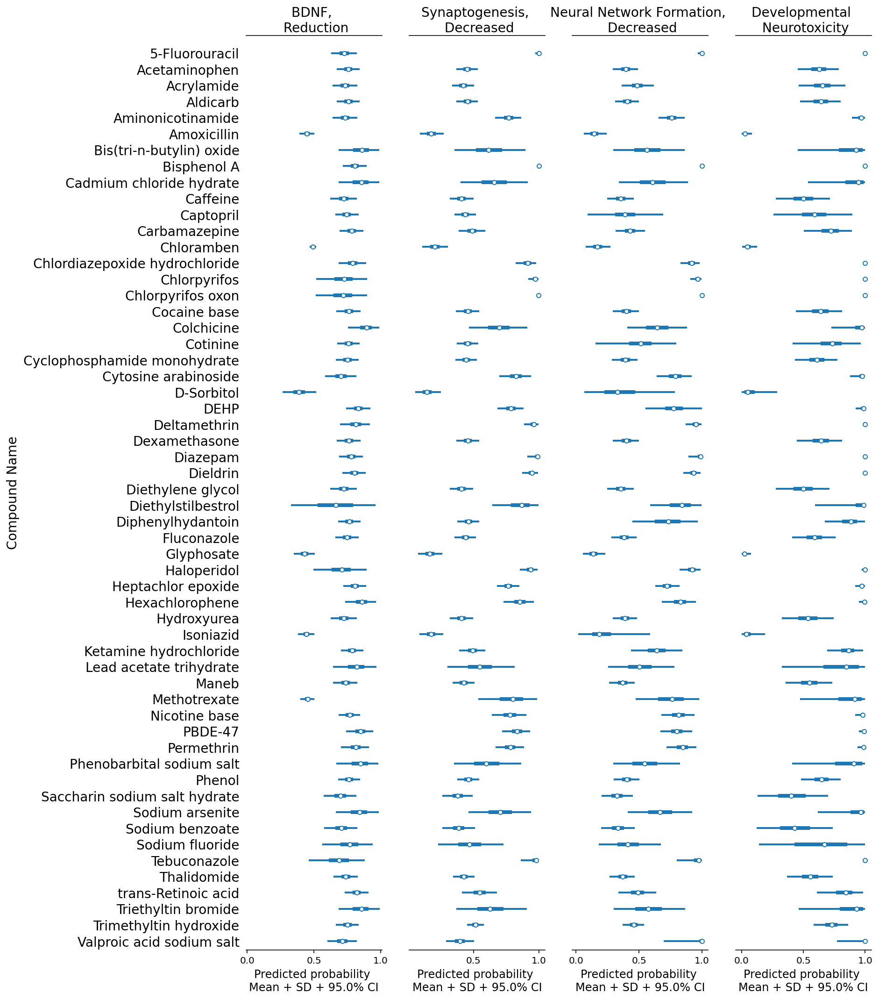

In [10]:
# ## Forestplots with underlying the compounds tested in both studies
fig, ax = plt.subplots(1, 4, figsize=(12, 18), sharey=True)


ax0 = az.plot_forest(trace_hierar, var_names='lp_bdnf', kind='forestplot', linewidth=2, markersize=6,
                    coords={'lp_bdnf_dim_0':[0,1,2,3,4,5,6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 
                                            38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[0])
ax0 = plt.gca()
ax0 = adjust_forestplot_for_slides(ax0)

ax1 = az.plot_forest(trace_hierar, var_names='lp_syn', kind='forestplot', linewidth=2, markersize=6,
                    coords={'lp_syn_dim_0':[0,1,2,3,4,5,6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 
                                            38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[1])
ax1 = plt.gca()
ax1 = adjust_forestplot_for_slides(ax1)

ax2 = az.plot_forest(trace_hierar, var_names='lp_nnf', kind='forestplot', linewidth=2, markersize=6,
                    coords={'lp_nnf_dim_0':[0,1,2,3,4,5,6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 
                                            38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[2])
ax2 = plt.gca()
ax2 = adjust_forestplot_for_slides(ax2)

ax3 = az.plot_forest(trace_hierar, var_names='lp_dnt', kind='forestplot', linewidth=2, markersize=6,
                    coords={'lp_dnt_dim_0':[0,1,2,3,4,5,6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 
                                            38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[3])
ax3 = plt.gca()
ax3 = adjust_forestplot_for_slides(ax3)

ax[0].set_yticklabels(ylabels_common[::-1], fontsize=14) #weight = 'bold'

#for ind in range(0,41):
    #ax[0].get_yticklabels()[ind] 

ax[0].set_xlim([-0.01,1.01])

for ax_ in ax:
    ax_.set_xlabel("Predicted probability \nMean + SD + 95.0% CI",  fontsize=12)

ax[0].set_ylabel("Compound Name", fontsize=14)
ax[0].set_title("BDNF, \n Reduction", fontsize=14)
ax[1].set_title("Synaptogenesis, \n Decreased", fontsize=14)
ax[2].set_title("Neural Network Formation, \n Decreased", fontsize=14)
ax[3].set_title("Developmental \n Neurotoxicity", fontsize=14);

plt.subplots_adjust(wspace=0.2)

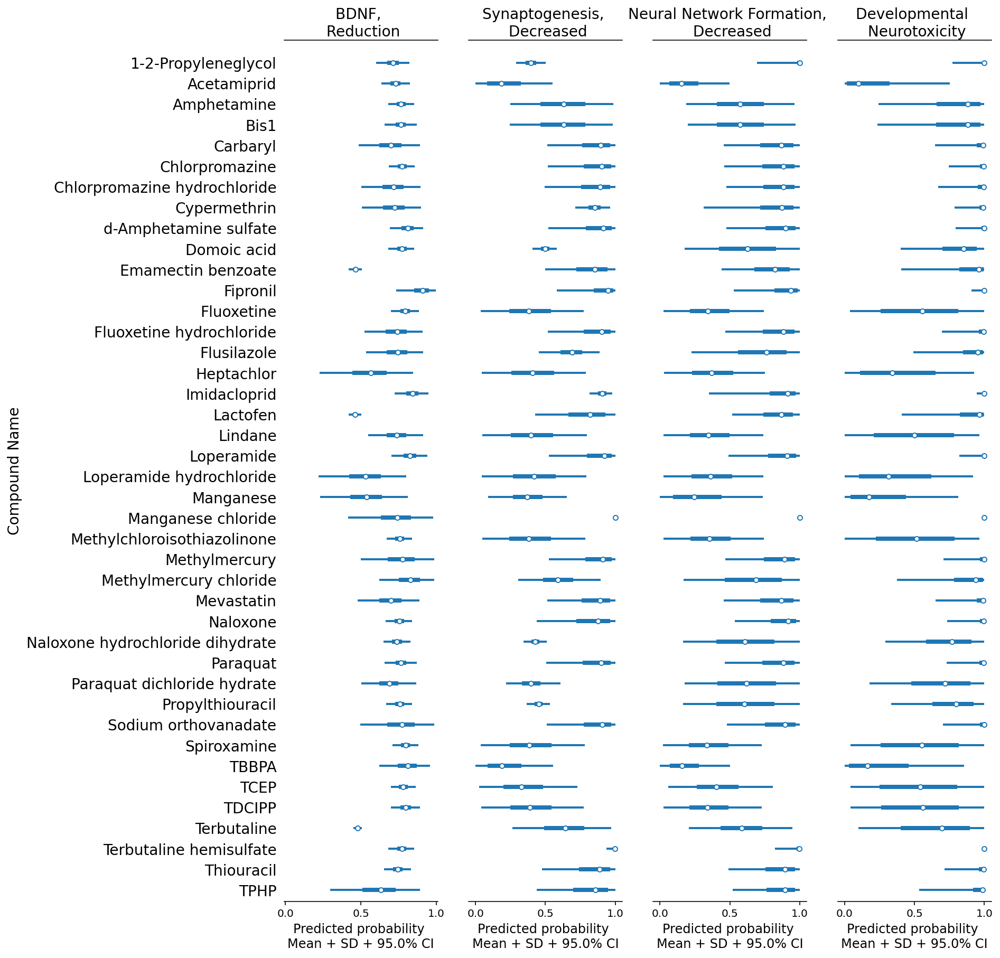

In [11]:
# ## Forestplots with underlying the compounds tested in one in vitro study
fig, ax = plt.subplots(1, 4, figsize=(12, 15), sharey=True)


ax0 = pm.forestplot(trace_hierar, var_names='lp_bdnf', kind='forestplot', linewidth=2, markersize=6,
                    coords={'lp_bdnf_dim_0':[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
                                            71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
                                            88, 89, 90, 91, 92, 93, 94, 95, 96]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[0])
ax0 = plt.gca()
ax0 = adjust_forestplot_for_slides(ax0)

ax1 = pm.forestplot(trace_hierar, var_names='lp_syn', kind='forestplot', linewidth=2, markersize=6,
                    coords={'lp_syn_dim_0':[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
                                            71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
                                            88, 89, 90, 91, 92, 93, 94, 95, 96]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[1])
ax1 = plt.gca()
ax1 = adjust_forestplot_for_slides(ax1)

ax2 = pm.forestplot(trace_hierar, var_names='lp_nnf', kind='forestplot', linewidth=2, markersize=6,
                    coords={'lp_nnf_dim_0':[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
                                            71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
                                            88, 89, 90, 91, 92, 93, 94, 95, 96]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[2])
ax2 = plt.gca()
ax2 = adjust_forestplot_for_slides(ax2)

ax3 = pm.forestplot(trace_hierar, var_names='lp_dnt', kind='forestplot', linewidth=2, markersize=6,
                    coords={'lp_dnt_dim_0':[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
                                            71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
                                            88, 89, 90, 91, 92, 93, 94, 95, 96]},
                    combined=True, transform=logistic, 
                    hdi_prob=0.95, textsize=10, ax = ax[3])
ax3 = plt.gca()
ax3 = adjust_forestplot_for_slides(ax3)

ax[0].set_yticklabels(ylabels_noncommon[::-1], fontsize=14) #weight = 'bold'

#for ind in range(0,41):
    #ax[0].get_yticklabels()[ind] 

ax[0].set_xlim([-0.01,1.01])

for ax_ in ax:
    ax_.set_xlabel("Predicted probability \nMean + SD + 95.0% CI",  fontsize=12)

ax[0].set_ylabel("Compound Name", fontsize=14)
ax[0].set_title("BDNF, \n Reduction", fontsize=14)
ax[1].set_title("Synaptogenesis, \n Decreased", fontsize=14)
ax[2].set_title("Neural Network Formation, \n Decreased", fontsize=14)
ax[3].set_title("Developmental \n Neurotoxicity", fontsize=14);

plt.subplots_adjust(wspace=0.2)

In [18]:
avg_obs_pred[order]

array([0.028475, 0.0353  , 0.056825, 0.06075 , 0.084375, 0.2059  ,
       0.26685 , 0.271325, 0.376825, 0.394   , 0.41115 , 0.429975,
       0.495075, 0.4969  , 0.499125, 0.5018  , 0.52515 , 0.5341  ,
       0.53675 , 0.53765 , 0.54005 , 0.548325, 0.550125, 0.57525 ,
       0.582225, 0.6039  , 0.622425, 0.6229  , 0.631525, 0.6318  ,
       0.63805 , 0.63925 , 0.642775, 0.651475, 0.664625, 0.70575 ,
       0.712625, 0.7253  , 0.72675 , 0.753925, 0.768575, 0.776475,
       0.779575, 0.780825, 0.794075, 0.8221  , 0.835175, 0.845075,
       0.850225, 0.851125, 0.852325, 0.8537  , 0.864825, 0.86525 ,
       0.867625, 0.87885 , 0.8818  , 0.90795 , 0.914775, 0.921825,
       0.93195 , 0.934825, 0.93545 , 0.93985 , 0.94705 , 0.9483  ,
       0.9494  , 0.949925, 0.951625, 0.9527  , 0.953925, 0.9551  ,
       0.95835 , 0.96205 , 0.96305 , 0.966325, 0.9668  , 0.96715 ,
       0.971975, 0.9772  , 0.981375, 0.98155 , 0.98505 , 0.987125,
       0.98785 , 0.99365 , 0.995   , 0.995025, 0.997775, 0.998

In [41]:
avg_obs_pred[order]

array([0.712825, 0.713575, 0.713925, 0.714325, 0.7145  , 0.7149  ,
       0.714925, 0.714975, 0.7154  , 0.715425, 0.7156  , 0.715625,
       0.715825, 0.716075, 0.71615 , 0.716175, 0.71625 , 0.716325,
       0.716375, 0.71645 , 0.71655 , 0.716575, 0.716675, 0.7167  ,
       0.716825, 0.716875, 0.7169  , 0.717025, 0.717075, 0.71715 ,
       0.717275, 0.717325, 0.71735 , 0.717375, 0.7175  , 0.71755 ,
       0.7177  , 0.717775, 0.7178  , 0.71785 , 0.718   , 0.7181  ,
       0.718125, 0.71825 , 0.718275, 0.718375, 0.718375, 0.718525,
       0.718675, 0.718825, 0.718875, 0.718925, 0.719   , 0.719   ,
       0.7191  , 0.719125, 0.71925 , 0.7193  , 0.71935 , 0.71945 ,
       0.7195  , 0.71965 , 0.719825, 0.719925, 0.719975, 0.720025,
       0.720025, 0.720075, 0.7201  , 0.720175, 0.720175, 0.720175,
       0.720225, 0.720275, 0.7203  , 0.72055 , 0.72055 , 0.720625,
       0.720875, 0.720925, 0.721425, 0.72155 , 0.721625, 0.721625,
       0.7219  , 0.722275, 0.722275, 0.72235 , 0.722625, 0.722

In [43]:
avg_obs_pred[order]

array([0.64155 , 0.6417  , 0.64285 , 0.643725, 0.644275, 0.644275,
       0.644275, 0.644425, 0.6445  , 0.644625, 0.644675, 0.64495 ,
       0.644975, 0.645075, 0.6452  , 0.64535 , 0.64545 , 0.64545 ,
       0.645475, 0.645475, 0.6455  , 0.64555 , 0.64565 , 0.64565 ,
       0.645925, 0.64595 , 0.646   , 0.64605 , 0.64615 , 0.646175,
       0.646175, 0.646275, 0.6463  , 0.6464  , 0.646475, 0.646475,
       0.64665 , 0.64665 , 0.64665 , 0.646725, 0.64675 , 0.646825,
       0.6469  , 0.64705 , 0.647125, 0.647275, 0.6473  , 0.6473  ,
       0.647425, 0.64745 , 0.64745 , 0.64745 , 0.64765 , 0.6477  ,
       0.647725, 0.647775, 0.647875, 0.6479  , 0.647925, 0.647925,
       0.648   , 0.648025, 0.648125, 0.648125, 0.64815 , 0.648275,
       0.648425, 0.64845 , 0.648475, 0.6486  , 0.648625, 0.648625,
       0.64865 , 0.6487  , 0.648875, 0.6489  , 0.64945 , 0.649475,
       0.649575, 0.649625, 0.64965 , 0.6497  , 0.649825, 0.649875,
       0.650025, 0.650375, 0.6506  , 0.650625, 0.65065 , 0.650

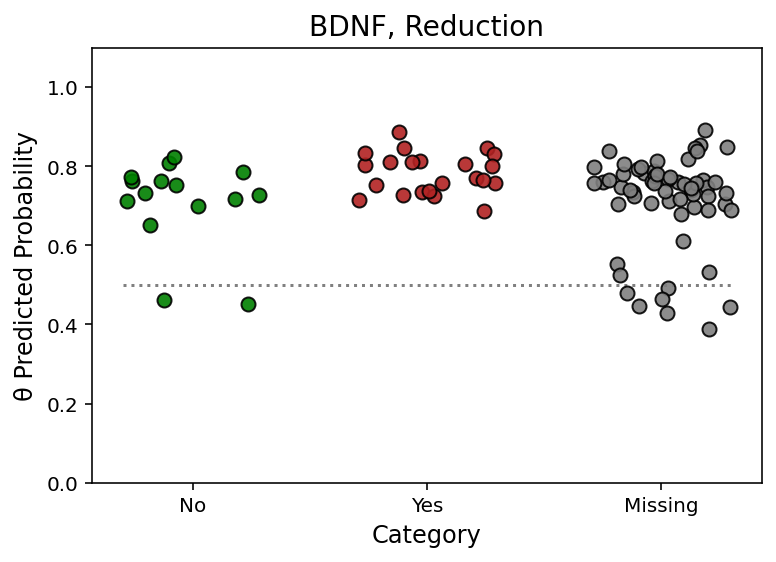

In [20]:
# BDNF
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("BDNF, Reduction", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("\u03B8 Predicted Probability", fontsize=12);

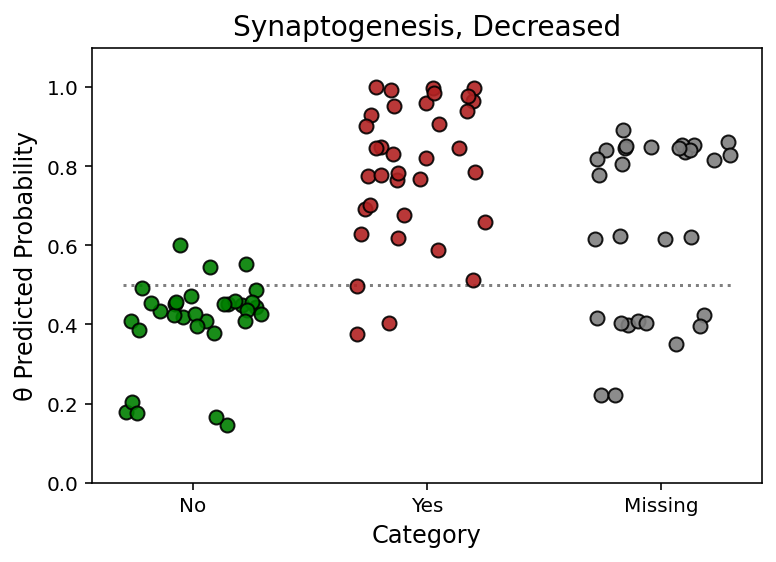

In [23]:
# SYN
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Synaptogenesis, Decreased", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("\u03B8 Predicted Probability", fontsize=12);

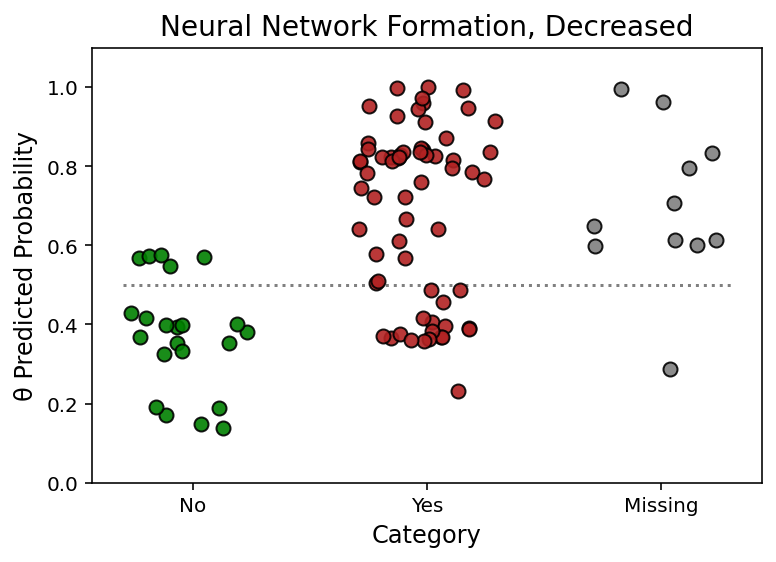

In [26]:
# NNF
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Neural Network Formation, Decreased", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("\u03B8 Predicted Probability", fontsize=12);

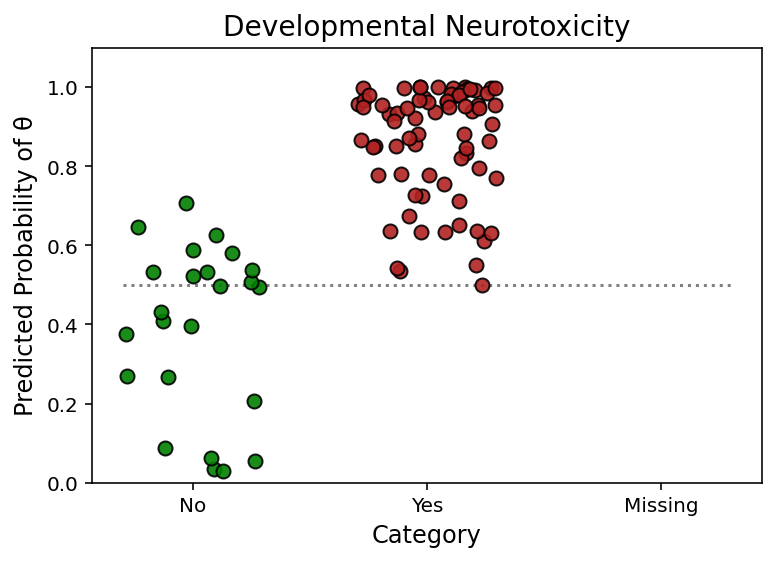

In [29]:
# DNT
for i in range(3):
    values = avg_obs_pred[class_label == i]
    x_ = i * np.ones_like(values) + np.random.uniform(-.3, .3, size=values.shape)
    plt.plot(x_, values, 'o', color=cc[i], alpha=.9, markersize=7, markeredgecolor='black')

plt.title("Developmental Neurotoxicity", fontsize=14)
plt.xlabel("Category", fontsize=12)
plt.xticks(np.arange(3), ("No", "Yes", "Missing"))
plt.ylim(0., 1.1)
plt.hlines(0.5, -0.3, 2.3, linestyles='dotted', colors = 'gray', label = '50%')
#sns.despine(top=True, right=True)
plt.ylabel("Predicted Probability of \u03B8", fontsize=12);

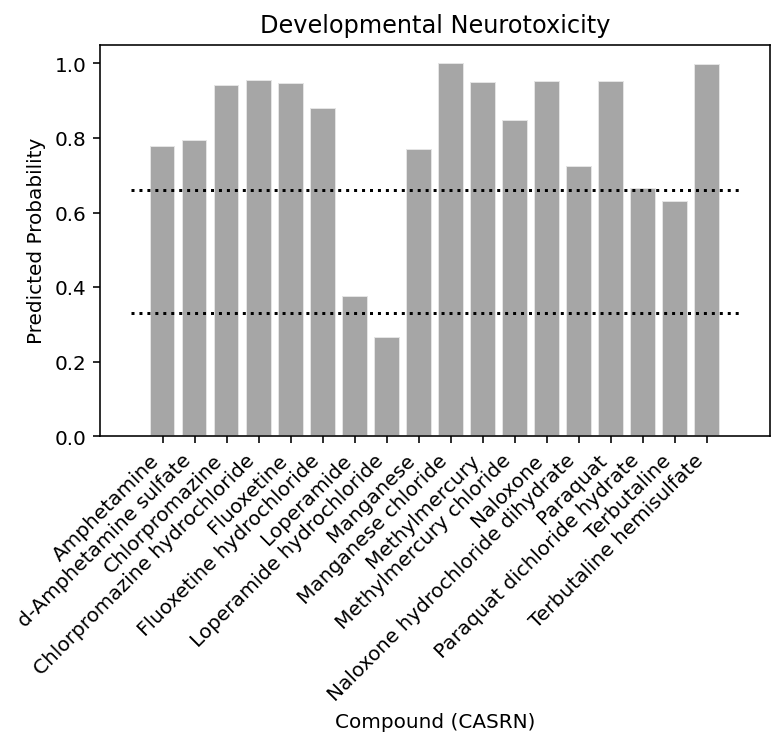

In [30]:
#Checking the 10 compounds tested under different CASRN
obs_dnt = np.squeeze(logistic(idata_hierar.posterior['lp_dnt']))
obs_pred = np.reshape(obs_dnt.values, (40000, 97))
avg_obs_pred = obs_pred.mean(axis=0)
#std_obs_pred = obs_pred.std(axis=0)
order = np.argsort(avg_obs_pred)

fig, ax = plt.subplots(figsize=(6,4))

ax.bar(np.arange(18), avg_obs_pred[[58,64, 61,62, 68,69, 75,76, 77,78, 80,81, 83,84, 85,86, 93,94]],
      edgecolor='white', alpha=0.7, color="grey");
ax.set_xticks(np.arange(18))
ax.set_xticklabels(ylabels[[58,64, 61,62, 68,69, 75,76, 77,78, 80,81, 83,84, 85,86, 93,94]]);
ax.set_ylabel('Predicted Probability')
ax.set_xlabel ('Compound (CASRN)')

ax.set_title('Developmental Neurotoxicity')

plt.hlines(0.33, -1, 18, linestyles='dotted', colors = 'black', label = '100%')
plt.hlines(0.66, -1, 18, linestyles='dotted', colors = 'black', label = '100%')

fig.autofmt_xdate(rotation=45);

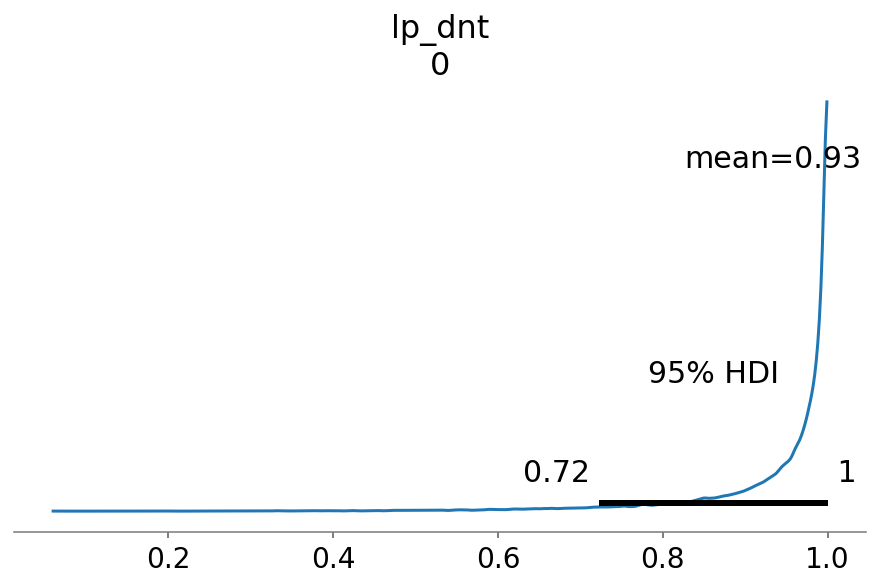

In [38]:
az.plot_posterior(idata_hierar.posterior, var_names='lp_dnt',
                 coords={'lp_dnt_dim_0': 17}, hdi_prob=0.95, transform=logistic);

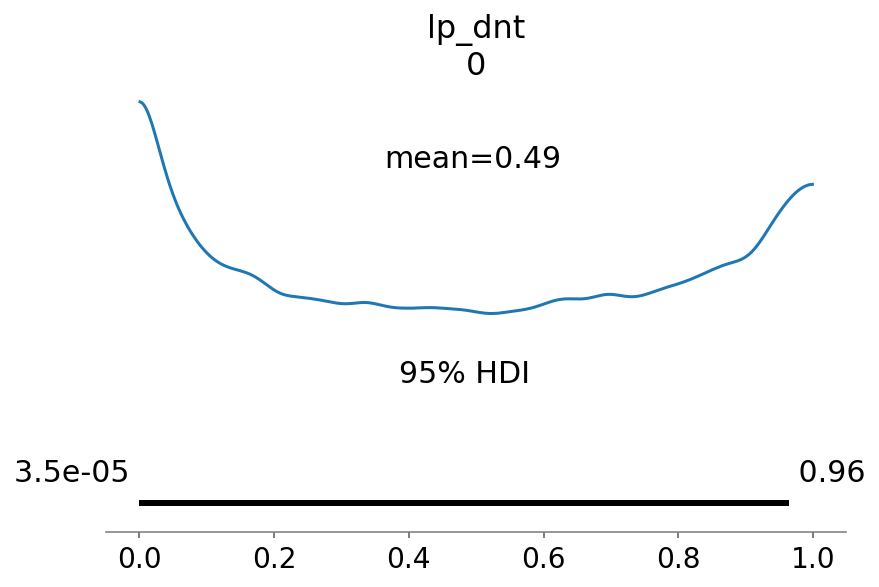

In [39]:
az.plot_posterior(idata_hierar.posterior, var_names='lp_dnt',
                 coords={'lp_dnt_dim_0': 73}, hdi_prob=0.95, transform=logistic);

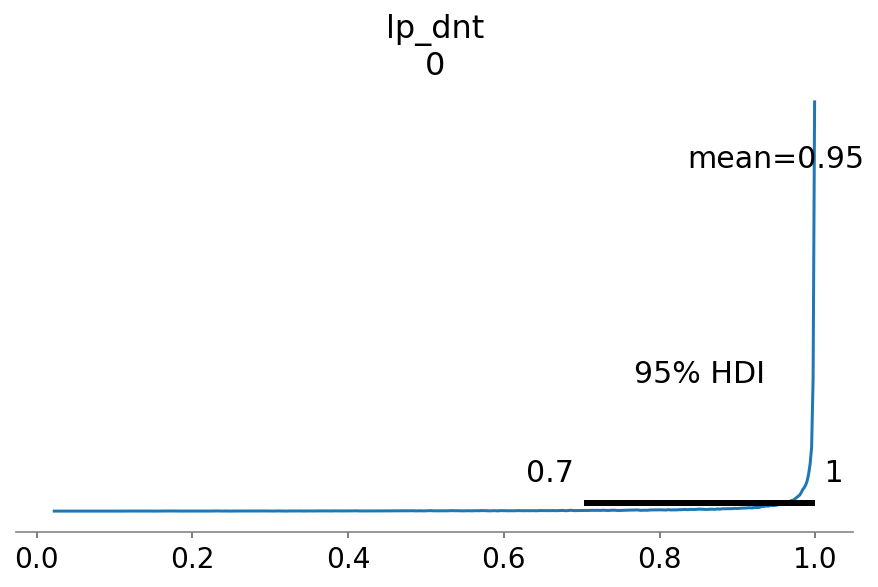

In [73]:
pm.plot_posterior(trace_hierar, var_names='lp_dnt',
                 coords={'lp_dnt_dim_0': 80}, hdi_prob=0.95, transform=logistic);

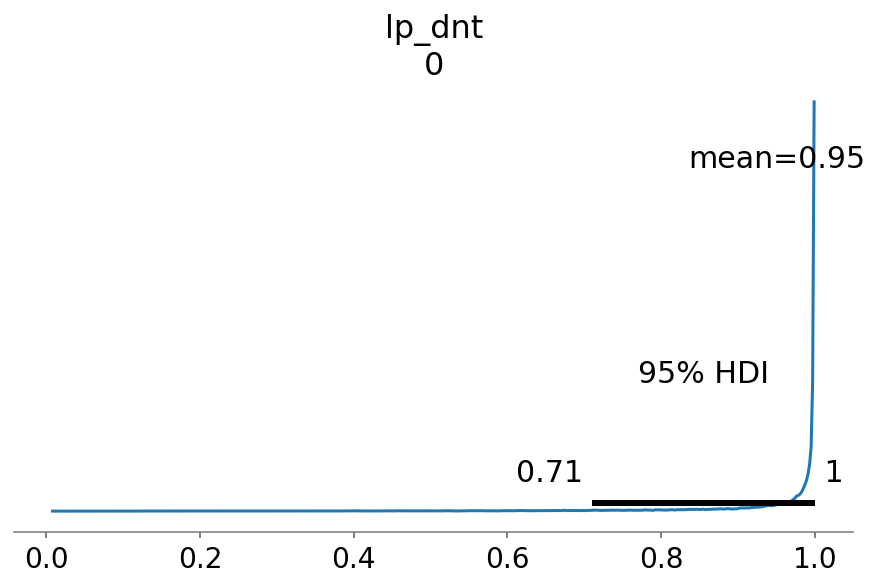

In [74]:
pm.plot_posterior(trace_hierar, var_names='lp_dnt',
                 coords={'lp_dnt_dim_0': 88}, hdi_prob=0.95, transform=logistic);

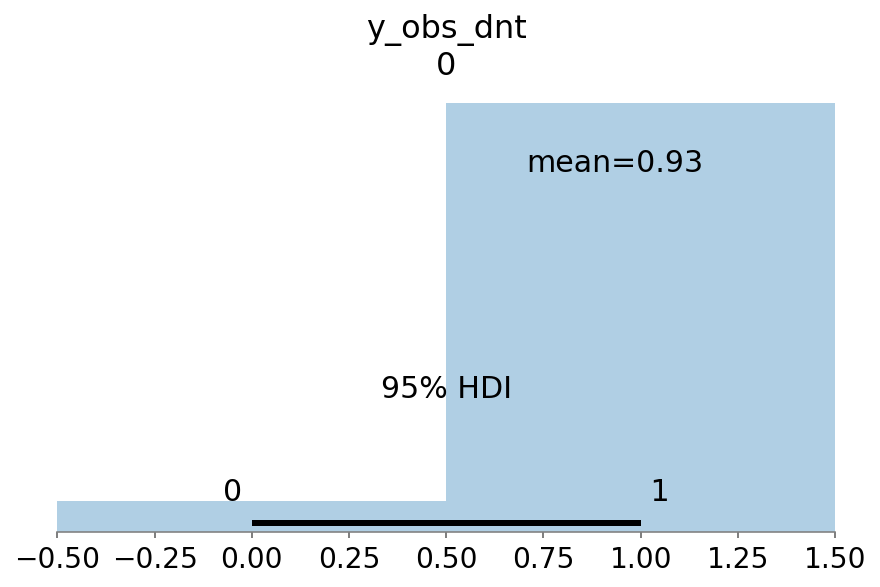

In [32]:
az.plot_posterior(idata_hierar.posterior_predictive, var_names='y_obs_dnt',
                 coords={'y_obs_dnt_dim_0': 17}, hdi_prob=0.95);

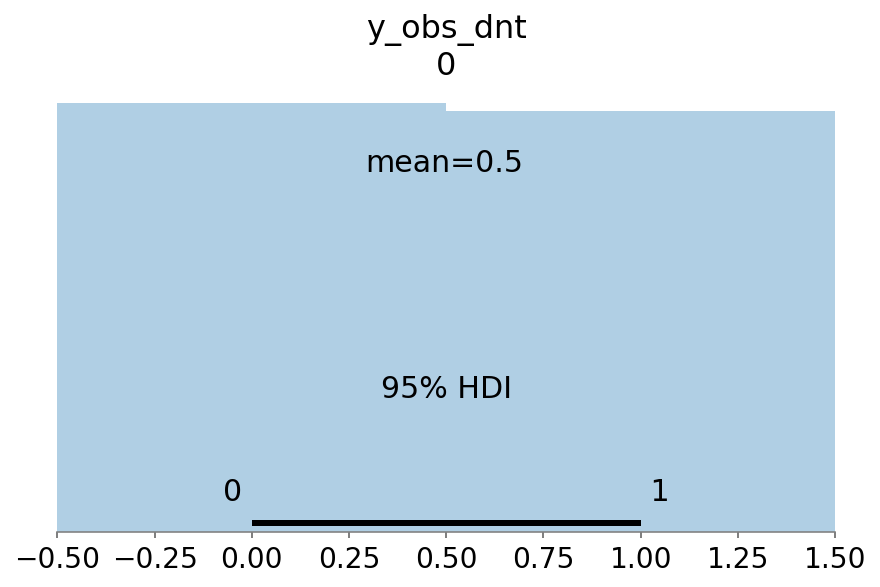

In [33]:
az.plot_posterior(idata_hierar.posterior_predictive, var_names='y_obs_dnt',
                 coords={'y_obs_dnt_dim_0': 73}, hdi_prob=0.95);

In [31]:
%load_ext watermark
%watermark -n -u -v -iv -w

pymc3      3.9.3
pandas     1.1.1
theano     1.0.4
arviz      0.10.0
matplotlib 3.3.1
numpy      1.19.1
seaborn    0.11.0
last updated: Thu May 13 2021 

CPython 3.8.5
IPython 7.18.1
watermark 2.0.2
